# Day 10 – Query Optimization & Explain Plans

## 1. Run heavy query

In [0]:
df = spark.table("workspace.default.gold_purchase_predictions")
df.display()

customerID,franchiseID,product,quantity,unitPrice,totalPrice,paymentMethod,label,hour,day,month,product_index,payment_index,product_vec,payment_vec,features,rawPrediction,probability,prediction
2000253,3000047,Golden Gate Ginger,8,3,24,amex,1,12,14,5,0.0,1.0,"{""type"":""0"",""size"":""5"",""indices"":[""0""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""1""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""8.0"",""3.0"",""24.0"",""12.0"",""14.0"",""5.0"",""1.0"",""0.0"",""0.0"",""0.0"",""0.0"",""0.0"",""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0
2000226,3000047,Austin Almond Biscotti,36,3,108,mastercard,1,23,10,5,4.0,0.0,"{""type"":""0"",""size"":""5"",""indices"":[""4""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""0""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""36.0"",""3.0"",""108.0"",""23.0"",""10.0"",""5.0"",""0.0"",""0.0"",""0.0"",""0.0"",""1.0"",""1.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0
2000108,3000047,Austin Almond Biscotti,40,3,120,mastercard,1,16,16,5,4.0,0.0,"{""type"":""0"",""size"":""5"",""indices"":[""4""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""0""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""40.0"",""3.0"",""120.0"",""16.0"",""16.0"",""5.0"",""0.0"",""0.0"",""0.0"",""0.0"",""1.0"",""1.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0
2000173,3000047,Pearly Pies,28,3,84,amex,1,4,2,5,3.0,1.0,"{""type"":""0"",""size"":""5"",""indices"":[""3""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""1""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""28.0"",""3.0"",""84.0"",""4.0"",""2.0"",""5.0"",""0.0"",""0.0"",""0.0"",""1.0"",""0.0"",""0.0"",""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0
2000075,3000047,Pearly Pies,28,3,84,visa,1,23,4,5,3.0,2.0,"{""type"":""0"",""size"":""5"",""indices"":[""3""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[],""values"":[]}","{""type"":""0"",""size"":""13"",""indices"":[""0"",""1"",""2"",""3"",""4"",""5"",""9""],""values"":[""28.0"",""3.0"",""84.0"",""23.0"",""4.0"",""5.0"",""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0
2000295,3000047,Austin Almond Biscotti,32,3,96,amex,1,16,15,5,4.0,1.0,"{""type"":""0"",""size"":""5"",""indices"":[""4""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""1""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""32.0"",""3.0"",""96.0"",""16.0"",""15.0"",""5.0"",""0.0"",""0.0"",""0.0"",""0.0"",""1.0"",""0.0"",""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0
2000237,3000047,Tokyo Tidbits,40,3,120,mastercard,1,11,7,5,1.0,0.0,"{""type"":""0"",""size"":""5"",""indices"":[""1""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""0""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""40.0"",""3.0"",""120.0"",""11.0"",""7.0"",""5.0"",""0.0"",""1.0"",""0.0"",""0.0"",""0.0"",""1.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity

In [0]:
from pyspark.sql.functions import col
from pyspark.ml.functions import vector_to_array

df_numeric = df.withColumn(
    "prob_array",
    vector_to_array(col("probability"))
)

In [0]:
df_numeric = df_numeric.withColumn(
    "purchase_probability",
    col("prob_array")[1]
)

df_numeric.display()

customerID,franchiseID,product,quantity,unitPrice,totalPrice,paymentMethod,label,hour,day,month,product_index,payment_index,product_vec,payment_vec,features,rawPrediction,probability,prediction,prob_array,purchase_probability
2000253,3000047,Golden Gate Ginger,8,3,24,amex,1,12,14,5,0.0,1.0,"{""type"":""0"",""size"":""5"",""indices"":[""0""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""1""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""8.0"",""3.0"",""24.0"",""12.0"",""14.0"",""5.0"",""1.0"",""0.0"",""0.0"",""0.0"",""0.0"",""0.0"",""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0,"List(0.0, 1.0)",1.0
2000226,3000047,Austin Almond Biscotti,36,3,108,mastercard,1,23,10,5,4.0,0.0,"{""type"":""0"",""size"":""5"",""indices"":[""4""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""0""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""36.0"",""3.0"",""108.0"",""23.0"",""10.0"",""5.0"",""0.0"",""0.0"",""0.0"",""0.0"",""1.0"",""1.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0,"List(0.0, 1.0)",1.0
2000108,3000047,Austin Almond Biscotti,40,3,120,mastercard,1,16,16,5,4.0,0.0,"{""type"":""0"",""size"":""5"",""indices"":[""4""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""0""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""40.0"",""3.0"",""120.0"",""16.0"",""16.0"",""5.0"",""0.0"",""0.0"",""0.0"",""0.0"",""1.0"",""1.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0,"List(0.0, 1.0)",1.0
2000173,3000047,Pearly Pies,28,3,84,amex,1,4,2,5,3.0,1.0,"{""type"":""0"",""size"":""5"",""indices"":[""3""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""1""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""28.0"",""3.0"",""84.0"",""4.0"",""2.0"",""5.0"",""0.0"",""0.0"",""0.0"",""1.0"",""0.0"",""0.0"",""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0,"List(0.0, 1.0)",1.0
2000075,3000047,Pearly Pies,28,3,84,visa,1,23,4,5,3.0,2.0,"{""type"":""0"",""size"":""5"",""indices"":[""3""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[],""values"":[]}","{""type"":""0"",""size"":""13"",""indices"":[""0"",""1"",""2"",""3"",""4"",""5"",""9""],""values"":[""28.0"",""3.0"",""84.0"",""23.0"",""4.0"",""5.0"",""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0,"List(0.0, 1.0)",1.0
2000295,3000047,Austin Almond Biscotti,32,3,96,amex,1,16,15,5,4.0,1.0,"{""type"":""0"",""size"":""5"",""indices"":[""4""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""1""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""32.0"",""3.0"",""96.0"",""16.0"",""15.0"",""5.0"",""0.0"",""0.0"",""0.0"",""0.0"",""1.0"",""0.0"",""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0,"List(0.0, 1.0)",1.0
2000237,3000047,Tokyo Tidbits,40,3,120,mastercard,1,11,7,5,1.0,0.0,"{""type"":""0"",""size"":""5"",""indices"":[""1""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""0""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""40.0"",""3.0"",""120.0

In [0]:
from pyspark.sql.functions import avg

heavy_query = df_numeric.groupBy("customerID") \
    .agg(
        avg("purchase_probability").alias("avg_probability")
    ) \
    .orderBy("avg_probability", ascending=False)

heavy_query.display()

customerID,avg_probability
2000253,1.0
2000226,1.0
2000108,1.0
2000173,1.0
2000075,1.0
2000295,1.0
2000237,1.0
2000272,1.0
2000209,1.0
2000120,1.0


## 2. Analyze explain plan

In [0]:
heavy_query.explain(True)

== Parsed Logical Plan ==
'Sort ['avg_probability DESC NULLS LAST], true
+- 'Aggregate ['customerID], ['customerID, 'avg('purchase_probability) AS avg_probability#23735]
   +- Project [customerID#23704L, franchiseID#23705L, product#23706, quantity#23707L, unitPrice#23708L, totalPrice#23709L, paymentMethod#23710, label#23711, hour#23712, day#23713, month#23714, product_index#23715, payment_index#23716, product_vec#23717, payment_vec#23718, features#23719, rawPrediction#23720, probability#23721, prediction#23722, prob_array#23725, prob_array#23725[1] AS purchase_probability#23729]
      +- Project [customerID#23704L, franchiseID#23705L, product#23706, quantity#23707L, unitPrice#23708L, totalPrice#23709L, paymentMethod#23710, label#23711, hour#23712, day#23713, month#23714, product_index#23715, payment_index#23716, product_vec#23717, payment_vec#23718, features#23719, rawPrediction#23720, probability#23721, prediction#23722, UDF(probability#23721) AS prob_array#23725]
         +- Subquery

## 3. Enable caching

In [0]:
import time

start = time.time()
heavy_query.collect()
end = time.time()

print("Execution Time:", end - start)

Execution Time: 0.5385651588439941


In [0]:
df_numeric

DataFrame[customerID: bigint, franchiseID: bigint, product: string, quantity: bigint, unitPrice: bigint, totalPrice: bigint, paymentMethod: string, label: int, hour: int, day: int, month: int, product_index: double, payment_index: double, product_vec: vector, payment_vec: vector, features: vector, rawPrediction: vector, probability: vector, prediction: double, prob_array: array<double>]

In [0]:
from pyspark.sql.functions import col
from pyspark.ml.functions import vector_to_array

df = spark.table("workspace.default.gold_purchase_predictions")

df_numeric = df.withColumn(
    "prob_array",
    vector_to_array(col("probability"))
)

df_numeric = df_numeric.withColumn(
    "purchase_probability",
    col("prob_array")[1]
)

df_numeric.display()

customerID,franchiseID,product,quantity,unitPrice,totalPrice,paymentMethod,label,hour,day,month,product_index,payment_index,product_vec,payment_vec,features,rawPrediction,probability,prediction,prob_array,purchase_probability
2000253,3000047,Golden Gate Ginger,8,3,24,amex,1,12,14,5,0.0,1.0,"{""type"":""0"",""size"":""5"",""indices"":[""0""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""1""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""8.0"",""3.0"",""24.0"",""12.0"",""14.0"",""5.0"",""1.0"",""0.0"",""0.0"",""0.0"",""0.0"",""0.0"",""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0,"List(0.0, 1.0)",1.0
2000226,3000047,Austin Almond Biscotti,36,3,108,mastercard,1,23,10,5,4.0,0.0,"{""type"":""0"",""size"":""5"",""indices"":[""4""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""0""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""36.0"",""3.0"",""108.0"",""23.0"",""10.0"",""5.0"",""0.0"",""0.0"",""0.0"",""0.0"",""1.0"",""1.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0,"List(0.0, 1.0)",1.0
2000108,3000047,Austin Almond Biscotti,40,3,120,mastercard,1,16,16,5,4.0,0.0,"{""type"":""0"",""size"":""5"",""indices"":[""4""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""0""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""40.0"",""3.0"",""120.0"",""16.0"",""16.0"",""5.0"",""0.0"",""0.0"",""0.0"",""0.0"",""1.0"",""1.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0,"List(0.0, 1.0)",1.0
2000173,3000047,Pearly Pies,28,3,84,amex,1,4,2,5,3.0,1.0,"{""type"":""0"",""size"":""5"",""indices"":[""3""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""1""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""28.0"",""3.0"",""84.0"",""4.0"",""2.0"",""5.0"",""0.0"",""0.0"",""0.0"",""1.0"",""0.0"",""0.0"",""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0,"List(0.0, 1.0)",1.0
2000075,3000047,Pearly Pies,28,3,84,visa,1,23,4,5,3.0,2.0,"{""type"":""0"",""size"":""5"",""indices"":[""3""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[],""values"":[]}","{""type"":""0"",""size"":""13"",""indices"":[""0"",""1"",""2"",""3"",""4"",""5"",""9""],""values"":[""28.0"",""3.0"",""84.0"",""23.0"",""4.0"",""5.0"",""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0,"List(0.0, 1.0)",1.0
2000295,3000047,Austin Almond Biscotti,32,3,96,amex,1,16,15,5,4.0,1.0,"{""type"":""0"",""size"":""5"",""indices"":[""4""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""1""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""32.0"",""3.0"",""96.0"",""16.0"",""15.0"",""5.0"",""0.0"",""0.0"",""0.0"",""0.0"",""1.0"",""0.0"",""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-Infinity"",""Infinity""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.0"",""1.0""]}",1.0,"List(0.0, 1.0)",1.0
2000237,3000047,Tokyo Tidbits,40,3,120,mastercard,1,11,7,5,1.0,0.0,"{""type"":""0"",""size"":""5"",""indices"":[""1""],""values"":[""1.0""]}","{""type"":""0"",""size"":""2"",""indices"":[""0""],""values"":[""1.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""40.0"",""3.0"",""120.0

In [0]:
from pyspark.sql.functions import avg

heavy_query = df_numeric.groupBy("customerID") \
    .agg(
        avg("purchase_probability").alias("avg_probability")
    ) \
    .orderBy("avg_probability", ascending=False)

heavy_query.display()

customerID,avg_probability
2000253,1.0
2000226,1.0
2000108,1.0
2000173,1.0
2000075,1.0
2000295,1.0
2000237,1.0
2000272,1.0
2000209,1.0
2000120,1.0


In [0]:
heavy_query.explain(True)

== Parsed Logical Plan ==
'Sort ['avg_probability DESC NULLS LAST], true
+- 'Aggregate ['customerID], ['customerID, 'avg('purchase_probability) AS avg_probability#45477]
   +- Project [customerID#45408L, franchiseID#45409L, product#45410, quantity#45411L, unitPrice#45412L, totalPrice#45413L, paymentMethod#45414, label#45415, hour#45416, day#45417, month#45418, product_index#45419, payment_index#45420, product_vec#45421, payment_vec#45422, features#45423, rawPrediction#45424, probability#45425, prediction#45426, prob_array#45429, prob_array#45429[1] AS purchase_probability#45432]
      +- Project [customerID#45408L, franchiseID#45409L, product#45410, quantity#45411L, unitPrice#45412L, totalPrice#45413L, paymentMethod#45414, label#45415, hour#45416, day#45417, month#45418, product_index#45419, payment_index#45420, product_vec#45421, payment_vec#45422, features#45423, rawPrediction#45424, probability#45425, prediction#45426, UDF(probability#45425) AS prob_array#45429]
         +- Subquery

In [0]:
import time

start = time.time()
heavy_query.collect()
end = time.time()

print("Execution Time (Run 1):", end - start)

Execution Time (Run 1): 0.47159433364868164


In [0]:
start = time.time()
heavy_query.collect()
end = time.time()

print("Execution Time (Run 2):", end - start)

Execution Time (Run 2): 0.5345184803009033


In [0]:
heavy_query = df_numeric.groupBy("customerID") \
    .agg(avg("purchase_probability").alias("avg_probability")) \
    .orderBy("avg_probability", ascending=False)

In [0]:
heavy_query.explain(True)

== Parsed Logical Plan ==
'Sort ['avg_probability DESC NULLS LAST], true
+- 'Aggregate ['customerID], ['customerID, 'avg('purchase_probability) AS avg_probability#49777]
   +- Project [customerID#45408L, franchiseID#45409L, product#45410, quantity#45411L, unitPrice#45412L, totalPrice#45413L, paymentMethod#45414, label#45415, hour#45416, day#45417, month#45418, product_index#45419, payment_index#45420, product_vec#45421, payment_vec#45422, features#45423, rawPrediction#45424, probability#45425, prediction#45426, prob_array#45429, prob_array#45429[1] AS purchase_probability#45432]
      +- Project [customerID#45408L, franchiseID#45409L, product#45410, quantity#45411L, unitPrice#45412L, totalPrice#45413L, paymentMethod#45414, label#45415, hour#45416, day#45417, month#45418, product_index#45419, payment_index#45420, product_vec#45421, payment_vec#45422, features#45423, rawPrediction#45424, probability#45425, prediction#45426, UDF(probability#45425) AS prob_array#45429]
         +- Subquery

In [0]:
import time


start1 = time.time()
heavy_query.collect()
end1 = time.time()

run1 = end1 - start1
print("Execution Time (Run 1):", run1)


start2 = time.time()
heavy_query.collect()
end2 = time.time()

run2 = end2 - start2
print("Execution Time (Run 2):", run2)

Execution Time (Run 1): 0.7132256031036377
Execution Time (Run 2): 0.3843553066253662


## 4. Compare execution time

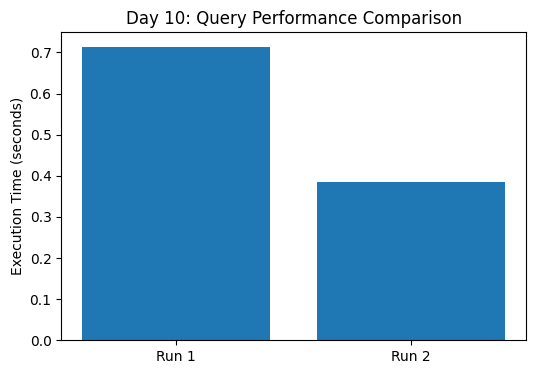

In [0]:
import matplotlib.pyplot as plt

runs = ["Run 1", "Run 2"]
times = [run1, run2]

plt.figure(figsize=(6,4))
plt.bar(runs, times)

plt.ylabel("Execution Time (seconds)")
plt.title("Day 10: Query Performance Comparison")
plt.show()